In [ ]:
# !pip install TTS

In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"]="1"

import sys
import nltk
import librosa
import torch
import numpy as np
import pandas as pd
import torchaudio
import random
from transformers import (
    Wav2Vec2ForCTC, Wav2Vec2Processor, Wav2Vec2ProcessorWithLM,
    AutoModelForCTC, Wav2Vec2BertProcessor,
    AutoModelForSpeechSeq2Seq, AutoProcessor, pipeline,
    EncodecModel, AutoProcessor
)

import IPython.display as ipd
import torch.nn as nn
import jsonlines

from transformers import AutoTokenizer
from torchaudio import info as audiofile_info
from torchmetrics.audio.dnsmos import DeepNoiseSuppressionMeanOpinionScore
from pyctcdecode import build_ctcdecoder
from glob import glob
from tqdm import tqdm

# If import failes - re-start notebook
from TTS.api import TTS

from matplotlib import pyplot as plt

%matplotlib inline

In [2]:
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
DEVICE

'cuda'

![Image Title](images/intro_meme.jpg)

# Agenda

1. [Intro](#Intro)

2. [Metrics](#Metrics)

2. [Tacotron Era](#Tacotron-era) 

4. [General Modern Approach](#General-Modern-Approach)

5. [xTTS](#xTTS)

6. [Other TTS Models](#Other-TTS-Models)


<a id='Intro'></a>
# Intro

## [Speech Synthesis](https://paperswithcode.com/task/speech-synthesis)

Speech synthesis is the task of generating speech from some other modality like text, lip movements, etc.

**Subtasks**:

- Text To Speech (TTS) — Synthesize audio from text. [Coqui.ai](https://github.com/coqui-ai/TTS).
- [Text(Speech) To Speech Translation](https://paperswithcode.com/task/text-to-speech-translation) — Synthesize audio in another language from the original one OR original audio + translated text. [SeamlessM4T](https://huggingface.co/spaces/facebook/seamless_m4t).
- Vocoding — Synthesize audio from spectral or other intermidiate representations.

**Examples**:

- Pure TTS services: [Respeecher](https://www.respeecher.com/), [ElevenLabs](https://elevenlabs.io/) and many other startups and companies.
- Assistive Technology for Visually Impaired — TTS is crucial in screen readers and other assistive technologies, enabling visually impaired individuals to consume digital text content, including books, websites, and documents.
- Navigation and GPS Systems — In GPS and navigation apps, TTS provides spoken directions and traffic updates, allowing users to focus on driving without needing to look at the screen.
- Public Announcements — Airports, train stations, and public venues use TTS for announcements, ensuring clear and consistent communication of important information like boarding calls or emergency alerts.
- Audio Books and Storytelling — TTS technology allows for the creation of audiobooks from written content, making literature more accessible and convenient for busy individuals or those who prefer listening over reading.
- Automated News Reading and Podcasts — TTS is used to convert written news articles, blogs, and other content into spoken words, creating automated news reading services or podcasts.

![](images/diagrams-speech_synthesis.drawio.png)

Let's generate something finally!

In order to use TTS models we will use [coqui-ai/TTS](https://github.com/coqui-ai/TTS) repository

In [3]:
xtts_v2 = TTS("tts_models/multilingual/multi-dataset/xtts_v2").to(DEVICE)

 > tts_models/multilingual/multi-dataset/xtts_v2 is already downloaded.
 > Using model: xtts


GPT2InferenceModel has generative capabilities, as `prepare_inputs_for_generation` is explicitly overwritten. However, it doesn't directly inherit from `GenerationMixin`. From 👉v4.50👈 onwards, `PreTrainedModel` will NOT inherit from `GenerationMixin`, and this model will lose the ability to call `generate` and other related functions.
  - If you're using `trust_remote_code=True`, you can get rid of this warning by loading the model with an auto class. See https://huggingface.co/docs/transformers/en/model_doc/auto#auto-classes
  - If you are the owner of the model architecture code, please modify your model class such that it inherits from `GenerationMixin` (after `PreTrainedModel`, otherwise you'll get an exception).
  - If you are not the owner of the model architecture class, please contact the model code owner to update it.


In [4]:
print("Available Speakers: ", xtts_v2.synthesizer.tts_model.speaker_manager.name_to_id)

Available Speakers:  dict_keys(['Claribel Dervla', 'Daisy Studious', 'Gracie Wise', 'Tammie Ema', 'Alison Dietlinde', 'Ana Florence', 'Annmarie Nele', 'Asya Anara', 'Brenda Stern', 'Gitta Nikolina', 'Henriette Usha', 'Sofia Hellen', 'Tammy Grit', 'Tanja Adelina', 'Vjollca Johnnie', 'Andrew Chipper', 'Badr Odhiambo', 'Dionisio Schuyler', 'Royston Min', 'Viktor Eka', 'Abrahan Mack', 'Adde Michal', 'Baldur Sanjin', 'Craig Gutsy', 'Damien Black', 'Gilberto Mathias', 'Ilkin Urbano', 'Kazuhiko Atallah', 'Ludvig Milivoj', 'Suad Qasim', 'Torcull Diarmuid', 'Viktor Menelaos', 'Zacharie Aimilios', 'Nova Hogarth', 'Maja Ruoho', 'Uta Obando', 'Lidiya Szekeres', 'Chandra MacFarland', 'Szofi Granger', 'Camilla Holmström', 'Lilya Stainthorpe', 'Zofija Kendrick', 'Narelle Moon', 'Barbora MacLean', 'Alexandra Hisakawa', 'Alma María', 'Rosemary Okafor', 'Ige Behringer', 'Filip Traverse', 'Damjan Chapman', 'Wulf Carlevaro', 'Aaron Dreschner', 'Kumar Dahl', 'Eugenio Mataracı', 'Ferran Simen', 'Xavier Haya

In [5]:
TEXT_PROMPT = """Welcome to an exciting journey into the world of Text-to-Speech (TTS) technology, where we empower machines to speak with natural, human-like voices. Today, here at the GEN AI School at Ukrainian Catholic University, we’ll dive into the fascinating mechanics behind modern TTS models. Let’s dive in and discover how text becomes voice!"""
TEXT_PROMPT

'Welcome to an exciting journey into the world of Text-to-Speech (TTS) technology, where we empower machines to speak with natural, human-like voices. Today, here at the GEN AI School at Ukrainian Catholic University, we’ll dive into the fascinating mechanics behind modern TTS models. Let’s dive in and discover how text becomes voice!'

In [6]:
TEXT_PROMPT_SHORT = "Welcome to an exciting journey into the world of Text-to-Speech (TTS) technology"
TEXT_PROMPT_SHORT

'Welcome to an exciting journey into the world of Text-to-Speech (TTS) technology'

In [7]:
# generate speech by cloning a voice using default settings
xtts_v2_wave = xtts_v2.tts(
    text=TEXT_PROMPT,
    speaker="Ludvig Milivoj",
    language="en",
    split_sentences=True
)

The attention mask is not set and cannot be inferred from input because pad token is same as eos token. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.


 > Text splitted to sentences.
['Welcome to an exciting journey into the world of Text-to-Speech (TTS) technology, where we empower machines to speak with natural, human-like voices.', 'Today, here at the GEN AI School at Ukrainian Catholic University, we’ll dive into the fascinating mechanics behind modern TTS models.', 'Let’s dive in and discover how text becomes voice!']
 > Processing time: 2.560483455657959
 > Real-time factor: 0.10101818620505067


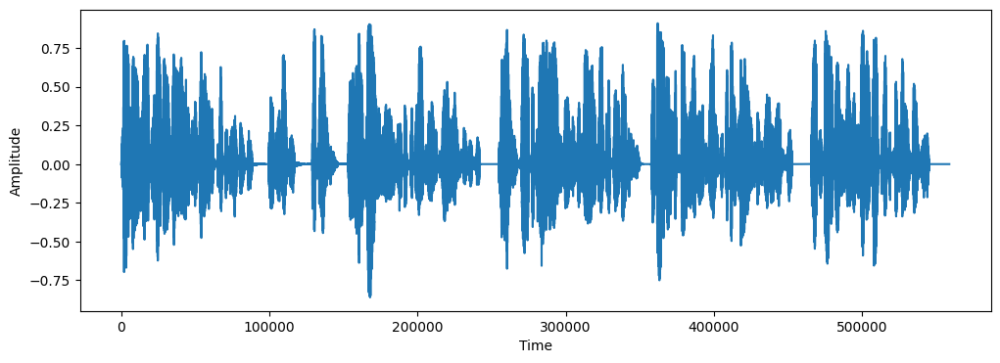

In [8]:
# Plot the waveform
plt.figure(figsize=(12, 4))
plt.plot(xtts_v2_wave)
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.show()

In [9]:
ipd.Audio(xtts_v2_wave, rate=24000)

<a id='Metrics'></a>
# Metrics

![](images/tts_metrics_meme.jpg)

## High-Level Criteria for TTS Model Evaluation

### Primary Criteria:
- **Phonetic Accuracy**: How well does the TTS model replicate the pronunciation and articulation of the text?
- **Naturalness**: Does the model sound like a real human? This includes natural pronunciation, appropriate pauses, and intonation, avoiding the "robotic" sound typical of older TTS systems.
- **Speaker Identity**: How closely does the model mimic the voice of the target speaker?

### Additional Considerations:
- **Emotional Expressiveness**: Is the model capable of conveying a range of emotions? This is crucial for synthesizing lively dialogues, as opposed to monotone audiobook narration.
- **Duration Control**: Can the model generate audio within specific time constraints, if required?
- **Other Factors**: Additional criteria might be relevant depending on the use case, such as noise reduction, cross-language capabilities, etc.

## Evaluation Metrics

### Subjective

#### Pros
- **Human Perception**: Directly reflects how end-users experience the TTS output.
- **Context Sensitivity**: Can account for nuances like emotion and intonation that automated metrics might miss.
- **Flexibility**: Can be adapted to different evaluation scenarios, such as conversational dialogue vs. audiobook narration.

#### Cons
- **Time-Consuming**: Requires significant human effort to collect and analyze feedback.
- **Subjectivity**: Results can vary between evaluators, leading to inconsistent outcomes.
- **Scalability**: Difficult to apply on a large scale or across diverse languages and dialects.
- **Impossible to compare different models**: Best case scenario is to have one focus group for all studies but it is impossible

#### Examples
- **Mean Opinion Score (MOS)**: Participants rate the quality of speech on a scale from 1 to 5.
- **Comparative Mean Opinion Score (CMOS)**: Participants rate the quality of the generated sample compared to real audio.
- **ABX Testing**: Evaluators choose which of two samples better matches a reference.
- **Speaker Similarity**: Listeners assess how closely the synthesized voice matches the target speaker.

### Objective

#### Pros
- **Consistency**: Provides reproducible and quantifiable results that are not influenced by individual biases.
- **Efficiency**: Can be automated and applied to large datasets, enabling rapid evaluation.
- **Scalability**: Easily applied across different languages, dialects, and contexts.

#### Cons
- **Lack of Perception Insight**: May not fully capture how humans perceive the synthesized speech.
- **Limited Contextual Sensitivity**: May overlook subtleties like emotion, prosody, or speaker identity.
- **Mismatch with Human Judgment**: Objective metrics may not always correlate with subjective human evaluations.

#### Examples
- **Phoneme Error Rate (PER)**: Measures accuracy of phoneme pronunciation against a reference. Phoneme are extracted using phoneme prediction model, for example fine-tuned for this task Wave2Vec
- **Word Error Rate (WER)**: Assesses the accuracy of word transcription. Transcription is extracted using ASR model
- **Speaker Encoder Cosine Similarity**: Extracts speaker embedding with neural net and compute distance. 
- **Predicted Naturalness Mean Opinion Score**: Special model to predict MOS, for example [UTMOS](https://arxiv.org/abs/2204.02152) or [DNSMOS](https://arxiv.org/pdf/2010.15258)

**I refer you to [xTTS paper](https://arxiv.org/abs/2406.04904), where they have used a bunch of obejctive and subjective metrics for TTS evaluation**}

Let's check WER of our sample and Deep Noise Suppression Mean Opinion Score (DNSMOS)

For getting the inverse transcript of the model, we will use [Whisper ASR model](https://arxiv.org/abs/2212.04356)

In [11]:
def levenshtein_distance(ref, hyp):
    """Calculates the Levenshtein distance between two sequences."""
    m, n = len(ref), len(hyp)

    if ref == hyp:
        return 0
    if m == 0:
        return n
    if n == 0:
        return m

    if m < n:
        ref, hyp = hyp, ref
        m, n = n, m

    previous_row = range(n + 1)
    for i, c1 in enumerate(ref):
        current_row = [i + 1]
        for j, c2 in enumerate(hyp):
            insertions = previous_row[j + 1] + 1
            deletions = current_row[j] + 1
            substitutions = previous_row[j] + (c1 != c2)
            current_row.append(min(insertions, deletions, substitutions))
        previous_row = current_row

    return previous_row[-1]

def normalize_text(text, ignore_case=False, remove_space=False):
    """Normalizes text based on the specified conditions."""
    if ignore_case:
        text = text.lower()
    if remove_space:
        text = ''.join(text.split())
    return text

def calculate_errors(reference, hypothesis, ignore_case=False, remove_space=False, delimiter=None):
    """Calculates edit distance and length/reference length based on the mode (word or char level)."""
    reference = normalize_text(reference, ignore_case, remove_space)
    hypothesis = normalize_text(hypothesis, ignore_case, remove_space)

    if delimiter:
        reference = reference.split(delimiter)
        hypothesis = hypothesis.split(delimiter)

    edit_distance = levenshtein_distance(reference, hypothesis)
    ref_len = len(reference)

    return float(edit_distance), ref_len

def wer(reference, hypothesis, ignore_case=False, delimiter=' '):
    """Calculates word error rate."""
    edit_distance, ref_len = calculate_errors(reference, hypothesis, ignore_case, False, delimiter)

    if ref_len == 0:
        raise ValueError("Reference's word number should be greater than 0.")

    return edit_distance / ref_len

<img src="images/calculating-word-error-rate-wer-formula.png" width="50%" height="auto">

***Figure**: Taken from [What is the OCR Accuracy and How it Can be Improved](https://www.docuclipper.com/blog/ocr-accuracy/)*

In [12]:
torch_dtype = torch.float16 if torch.cuda.is_available() else torch.float32

seq2seq_model_name = "openai/whisper-large-v3"

seq2seq_model = AutoModelForSpeechSeq2Seq.from_pretrained(
    seq2seq_model_name, 
    torch_dtype=torch_dtype, 
    low_cpu_mem_usage=True, 
    use_safetensors=True
)
seq2seq_model.to(DEVICE)

seq2seq_processor = AutoProcessor.from_pretrained(seq2seq_model_name)

pipe = pipeline(
    "automatic-speech-recognition",
    model=seq2seq_model,
    tokenizer=seq2seq_processor.tokenizer,
    feature_extractor=seq2seq_processor.feature_extractor,
    torch_dtype=torch_dtype,
    device=DEVICE,
)

Device set to use cuda


In [13]:
def transcript_with_whisper(
    input_sample,
    sample_sr,
    whisper_pipe,
    generate_kwargs={"language": "english"}
):
    whisper_resampler = torchaudio.transforms.Resample(
        sample_sr, 
        16_000, 
    )
    resampled_audio = whisper_resampler(
        torch.tensor(input_sample).unsqueeze(0).float()
    ).squeeze(0).numpy()
    
    return whisper_pipe(resampled_audio, generate_kwargs=generate_kwargs)["text"]

xtts_v2_transcript = transcript_with_whisper(
    input_sample=xtts_v2_wave,
    sample_sr=24000,
    whisper_pipe=pipe
)
xtts_v2_transcript

/data/vsydorskyi/src/ucu_audio_processing_course/.venv/lib/python3.10/site-packages/transformers/models/whisper/generation_whisper.py:573: FutureWarning: The input name `inputs` is deprecated. Please make sure to use `input_features` instead.
  warnings.warn(
You have passed language=english, but also have set `forced_decoder_ids` to [[1, None], [2, 50360]] which creates a conflict. `forced_decoder_ids` will be ignored in favor of language=english.


" Welcome to an exciting journey into the world of text-to-speech technology, where we empower machines to speak with natural, human-like voices. Today, here at the G&AI School at Ukrainian Catholic University, we'll dive into the fascinating mechanics behind modern TTS models. Let's dive in and discover how text becomes voice."

In [14]:
print(f"WER(referance, xTTS -> Whisper V3): {wer(TEXT_PROMPT, xtts_v2_transcript)}")

WER(referance, xTTS -> Whisper V3): 0.15384615384615385


Now let's compute Deep Noise Suppression Mean Opinion Score (DNSMOS)

![DNSMOS](images/DNSMOS_model.png)

In [15]:
dnsmos_computer = DeepNoiseSuppressionMeanOpinionScore(24000, False)
dnsmos_results = dnsmos_computer(torch.tensor(xtts_v2_wave).float())
{
    key: res.item() for key, res in zip(
        ['p808_mos', 'mos_sig', 'mos_bak', 'mos_ovr'],
        dnsmos_results
    )
}

{'p808_mos': 4.109929425375802,
 'mos_sig': 3.6701760564636827,
 'mos_bak': 4.208770452960368,
 'mos_ovr': 3.480933470687778}

<a id='Tacotron-era'></a>
# Tacotron Era

![](images/tacotron_meme.jpg)

## Input: Text Tokenization 

Tokenization is the process of converting raw text into a sequence of tokens that the model can process. In TTS, the choice of tokenization impacts pronunciation accuracy and model performance.

- **Character-Level Tokenization:**
  - *Description*: Splits text into individual characters.
  - *Example*: "Hello" → ['H', 'e', 'l', 'l', 'o']
  - *Usage*: Employed in models like Tacotron 2 for simplicity.

- **Phoneme-Level Tokenization:**
  - *Description*: Converts text into phonemes using Grapheme-to-Phoneme (G2P) [models](https://github.com/CiscoDevNet/g2p_seq2seq_pytorch).
  - *Example*: "Hello" → ['HH', 'AH', 'L', 'OW']
  - *Usage*: Improves pronunciation accuracy, especially in languages with irregular spelling.

- **Subword Tokenization:**
  - *Description*: Breaks text into subword units using algorithms like Byte Pair Encoding (BPE).
  - *Example*: "unhappiness" → ['un', 'happi', 'ness']
  - *Usage*: Balances vocabulary size and representation granularity.

## Output: Audio Representations

To synthesize speech, TTS models convert textual input into audio features before generating waveforms.

- **Mel Spectrograms:**
  - *Description*: Time-frequency representation emphasizing perceptually relevant frequencies.
  - *Usage*: Widely used in models like Tacotron 2 as an intermediate representation.

- **Linear Spectrograms:**
  - *Description*: Detailed frequency representation without perceptual scaling.
  - *Usage*: Provides more detailed frequency information but may be more sensitive to noise.

- **Raw Waveforms:**
  - *Description*: Direct representation of audio signals in the time domain.
  - *Usage*: Used in end-to-end models like WaveNet and Wave-Tacotron, eliminating the need for intermediate representations.

## General Seq2Seq Approach

Sequence-to-Sequence (Seq2Seq) models are designed to transform one sequence into another. You are probably familiar with Seq2Seq models in context of NLP in such tasks like `Machine Translation` or `Text Summarization`. Let's recall general architecture of these models: ![](https://blog.paperspace.com/content/images/2022/08/encoder.png)

- **Encoder:** Processes the input text sequence and encodes it into a fixed-dimensional context vector.

- **Decoder:** Generates the output sequence (e.g., mel spectrogram) from the context vector.

- **Attention Mechanism:** Allows the decoder to focus on different parts of the input sequence during generation, improving alignment between input and output.

> **Explore**: read more about [attention mechanisms](https://blog.paperspace.com/introduction-to-neural-machine-translation-with-bahdanaus-attention)

## Tacotron Architecture

Tacotron 2, developed by NVIDIA, is a prominent Seq2Seq model for TTS. It combines a recurrent sequence-to-sequence feature prediction network with a vocoder to synthesize speech.

**Architecture Overview:**

<img src="https://pytorch.org/assets/images/tacotron2_diagram.png" width="50%" height="auto">

**Components:**

1. **Text Encoder:** Converts input text into a sequence of embeddings.

2. **Attention Mechanism:** Employs location-sensitive attention to align text and audio sequences.

3. **Decoder:** An autoregressive LSTM-based network that generates mel spectrogram frames.

4. **Post-Processing Network:** A convolutional network that refines the predicted mel spectrogram.

5. **Vocoder (WaveGlow):** Converts the mel spectrogram into time-domain waveform samples. __Important:__ Vocoder is trained separately from main model.

> **Explore:** [official](https://catalog.ngc.nvidia.com/orgs/nvidia/resources/tacotron_2_and_waveglow_for_pytorch/performance) Tacotron2 performance and documentation

## Loss Functions 

$$L_{\text{model}} = \underbrace{\|f^P - y\|^2 + \|f^D - y\|^2}_{\text{Mel-spectrogram MSE loss}} + \underbrace{\text{BCEWithLogits}(g, g_{\text{target}})}_{\text{Gate loss}}$$

Where:
- $ f^P $ — mel spectrogram predicted by the decoder (before postnet)
- $ f^D $ — mel spectrogram predicted after postnet
- $ y $ — ground truth mel spectrogram
- $ g $ — gate output (logits)
- $ g_{\text{target}} $ — ground truth end-of-sequence flags (1 if EOS, 0 otherwise)

In [16]:
tacotron2 = torch.hub.load('NVIDIA/DeepLearningExamples:torchhub', 'nvidia_tacotron2', model_math='fp16')
tacotron2 = tacotron2.to('cuda')

Using cache found in /home/vsydorskyi/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub
/home/vsydorskyi/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/common.py:13: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
/home/vsydorskyi/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/efficientnet.py:17: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(


In [17]:
waveglow = torch.hub.load('NVIDIA/DeepLearningExamples:torchhub', 'nvidia_waveglow', model_math='fp16')
waveglow = waveglow.remove_weightnorm(waveglow)
waveglow = waveglow.to('cuda')

Using cache found in /home/vsydorskyi/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub
/data/vsydorskyi/src/ucu_audio_processing_course/.venv/lib/python3.10/site-packages/torch/nn/utils/weight_norm.py:30: UserWarning: torch.nn.utils.weight_norm is deprecated in favor of torch.nn.utils.parametrizations.weight_norm.
  warnings.warn("torch.nn.utils.weight_norm is deprecated in favor of torch.nn.utils.parametrizations.weight_norm.")


In [18]:
utils = torch.hub.load('NVIDIA/DeepLearningExamples:torchhub', 'nvidia_tts_utils')

Using cache found in /home/vsydorskyi/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub


In [22]:
tacotron2.eval()
waveglow.eval();

In [20]:
sequences, lengths = utils.prepare_input_sequence([TEXT_PROMPT_SHORT])
with torch.inference_mode():
    mel, _, _ = tacotron2.infer(sequences, lengths)
    audio = waveglow.infer(mel)
audio_numpy = audio[0].data.cpu().numpy()
tacotron_rate = 22050

In [21]:
ipd.Audio(audio_numpy, rate=tacotron_rate)

In [23]:
tacotron_2_transcript = transcript_with_whisper(
    input_sample=audio_numpy,
    sample_sr=tacotron_rate,
    whisper_pipe=pipe
)
tacotron_2_transcript

' Welcome to an exciting journey into the world of text-to-speech, test, technologich,'

In [24]:
print(f"WER(referance, Tacotron 2 -> Whisper V3): {wer(TEXT_PROMPT_SHORT, tacotron_2_transcript)}")

WER(referance, Tacotron 2 -> Whisper V3): 0.3333333333333333


In [25]:
dnsmos_computer = DeepNoiseSuppressionMeanOpinionScore(tacotron_rate, False)
dnsmos_results = dnsmos_computer(torch.tensor(audio_numpy).float())
{
    key: res.item() for key, res in zip(
        ['p808_mos', 'mos_sig', 'mos_bak', 'mos_ovr'],
        dnsmos_results
    )
}

{'p808_mos': 3.681240717569987,
 'mos_sig': 3.4386258693508633,
 'mos_bak': 3.7961042837716352,
 'mos_ovr': 3.06384162798795}

⚡ **You can find the model training code in Module 5 Lecture 1 at this repo. Also check out [lecture recording](https://youtu.be/_SDNQxSIdOM)**

<a id='General-Modern-Approach'></a>
# General Modern Approach

![](images/llms_all_meme.jpg)

## General concept 

```
A mathematician and a physicist were given the same task: to boil a kettle. The available tools were a stove, a kettle, a water tap, and matches. Both of them, in turn, filled the kettle with water, turned on the gas, lit it, and placed the kettle on the flame.

Then the task was simplified: they were given a kettle already filled with water and a stove with the gas already lit. The goal remained the same — to boil the water. The physicist placed the kettle on the flame. The mathematician poured the water out of the kettle, turned off the gas, and said, 'The problem has been reduced to the previous one.'
```

1. Transform continuous waveform into a discrete representation
2. Concatenate discrete text representations and audio representations
3. Apply language modeling to predict audio representations from text
4. Decode discrete audio representations back into a waveform

## Everything started from Tortoise !!!

So called "Tortoise" TTS system (as you can understand not really fast one :)) was introduced at [Better speech synthesis through scaling](https://arxiv.org/pdf/2305.07243)

![](images/tortoise_architecture.png)

## Next we moved forward to Valle

![](images/valle_scheme.png)

***Figure**: Taken from [Neural Codec Language Models are Zero-Shot Text to Speech Synthesizers](https://arxiv.org/abs/2301.02111)*

## Step 1 and 4. Encode and Decode audio into Discrete Representations

![](images/encodec.png)

***Figure**: Taken from [High Fidelity Neural Audio Compression](https://arxiv.org/abs/2210.13438)*

Let's take one audio from [VCTK](https://paperswithcode.com/dataset/vctk) dataset. We will download it from [Kaggle dataset](https://www.kaggle.com/datasets/mfekadu/english-multispeaker-corpus-for-voice-cloning).

In [26]:
audio_input, sample_rate_original = librosa.load(
    "p376_001.wav", sr=None
)
print(f"Audio Sample Rate: {sample_rate_original}")

Audio Sample Rate: 48000


In [1]:
!cat p376_001.txt

"Please call Stella.  "

In [27]:
# load the model + processor (for pre-processing the audio)
encodec_model = EncodecModel.from_pretrained("facebook/encodec_32khz")
encodec_processor = AutoProcessor.from_pretrained("facebook/encodec_32khz")

encodec_model.to(DEVICE);

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


In [28]:
# Resample audio
resampler = torchaudio.transforms.Resample(
    sample_rate_original, 
    32_000, 
)
resampled_audio = resampler(
    torch.from_numpy(audio_input).unsqueeze(0).float()
).squeeze(0).numpy()

In [29]:
ipd.Audio(resampled_audio, rate=32_000)

In [30]:
# pre-process the inputs
inputs = encodec_processor(
    raw_audio=resampled_audio, 
    sampling_rate=encodec_processor.sampling_rate, 
    return_tensors="pt"
)

# explicitly encode then decode the audio inputs
with torch.inference_mode():
    encoder_outputs = encodec_model.encode(inputs["input_values"].to(DEVICE), inputs["padding_mask"].to(DEVICE))
    audio_values = encodec_model.decode(encoder_outputs.audio_codes, encoder_outputs.audio_scales, inputs["padding_mask"])[0]

In [31]:
ipd.Audio(audio_values[0,0].cpu().numpy(), rate=32_000)

In [32]:
encoder_outputs.audio_codes.shape

torch.Size([1, 1, 4, 169])

## Step 3 and 4. Audio Language Modelling and "High Level Residuals" Reconstruction

![](images/valle_ar_nar.png)

***Figure**: Taken from [Neural Codec Language Models are Zero-Shot Text to Speech Synthesizers](https://arxiv.org/abs/2301.02111)*

To synthesize speech, you should perform 2 steps:

1. Take encoded text (G2P stands for Grapheme to Phonemes; after that, you simply introduce an embedding matrix for each phoneme) and target speaker discrete speech codes. So you have the next sequence [Phonemes, Target Speaker Codes, ...], and now for `...` you predict first-level EncoDec codes
2. Than you take Non Autoregressive Transformer and predict Higher Level codes

### Explore More Models and Modifications

![](images/speech_trident.png)

***Figure**: Taken from [speech-trident GitHub](https://github.com/ga642381/speech-trident)*

⚡ **You can find more detailed explanations in Module 5 Lecture 2 in this repo**

<a id='xTTS'></a>
# xTTS

![](images/xtts_main_scheme.png)

***Figure**: Taken from [XTTS: a Massively Multilingual Zero-Shot Text-to-Speech Model](https://arxiv.org/abs/2406.04904)*

## Main Ideas

- **VQ-VAE**: xTTS also uses discrete audio representations BUT it does not use several level Codecs but only one level codec
- **GPT-2 Encoder**: It is really a decoder-only model, and it decoded text tokens and speaker conditions into audio tokens. But in the whole framework it is Encoder, because it "encodes" audio into latent representations. Also pay attention - only 443M, not billions like in NLP models
- **Byte-Pair Encoding**: Explore it in more details in [original article](http://www.pennelynn.com/Documents/CUJ/HTML/94HTML/19940045.HTM). Pay attention that it is not graphemes or phonemes, so we pass more information to the model. At the same time increasing task complexity
- **Perceiver Resampler**: Special Attention Module in order to supply target speaker condition

![](images/perceiver_resampler.png)

***Figure**: Taken from [Flamingo: a Visual Language Model for Few-Shot Learning](https://arxiv.org/abs/2204.14198)*

- <span style="color: red;">**Decode NOT centroids but latents**</span>: Audio Decoder is [HiGi-GAN](https://arxiv.org/abs/2010.05646) and it is trained on GPT latents before final linear
- **Additional Speaker embedding to Audio Decoder** - [H/ASP model](https://arxiv.org/pdf/2009.14153) is used to extract embedding for Vocoder
- **Speaker Consistency Loss** - Simply extract speaker embeddings with pre-trained NN and minimize difference between them

![](images/scl_loss.png)

***Figure**: Taken from [YourTTS: Towards Zero-Shot Multi-Speaker TTS and Zero-Shot Voice Conversion for everyone](https://arxiv.org/abs/2112.02418)*

Let's experiment a bit with sampling parameters and languages

- `temperature`: The softmax temperature of the autoregressive model. Defaults to 0.65.

- `length_penalty`: A length penalty applied to the autoregressive decoder. Higher settings causes the model to produce more terse outputs. Defaults to 1.0.

- `repetition_penalty`: A penalty that prevents the autoregressive decoder from repeating itself during decoding. Can be used to reduce the incidence of long silences or “uhhhhhhs”, etc. Defaults to 2.0.

- `top_k`: Lower values mean the decoder produces more “likely” (aka boring) outputs. Defaults to 50.

- `top_p`: Lower values mean the decoder produces more “likely” (aka boring) outputs. Defaults to 0.8.

- `speed`: The speed rate of the generated audio. Defaults to 1.0. (can produce artifacts if far from 1.0)

In [33]:
xtts_v2_wave_temp04 = xtts_v2.tts(
    text=TEXT_PROMPT,
    speaker="Ana Florence",
    language="en",
    split_sentences=True,
    temperature=0.4
)

xtts_v2_wave_temp08 = xtts_v2.tts(
    text=TEXT_PROMPT,
    speaker="Ana Florence",
    language="en",
    split_sentences=True,
    temperature=0.8
)

 > Text splitted to sentences.
['Welcome to an exciting journey into the world of Text-to-Speech (TTS) technology, where we empower machines to speak with natural, human-like voices.', 'Today, here at the GEN AI School at Ukrainian Catholic University, we’ll dive into the fascinating mechanics behind modern TTS models.', 'Let’s dive in and discover how text becomes voice!']
 > Processing time: 2.671116352081299
 > Real-time factor: 0.09510249367587362
 > Text splitted to sentences.
['Welcome to an exciting journey into the world of Text-to-Speech (TTS) technology, where we empower machines to speak with natural, human-like voices.', 'Today, here at the GEN AI School at Ukrainian Catholic University, we’ll dive into the fascinating mechanics behind modern TTS models.', 'Let’s dive in and discover how text becomes voice!']
 > Processing time: 2.5379676818847656
 > Real-time factor: 0.09409584653620948


In [34]:
# Default temperature=0.65
ipd.Audio(xtts_v2_wave, rate=24000)

In [35]:
ipd.Audio(xtts_v2_wave_temp04, rate=24000)

In [36]:
ipd.Audio(xtts_v2_wave_temp08, rate=24000)

In [37]:
text_to_generate_fr = "Bienvenue dans un voyage passionnant au cœur de la technologie Text-to-Speech (TTS), où nous donnons aux machines le pouvoir de parler avec des voix naturelles et humaines. Aujourd’hui, ici à la GEN AI School de l’Université Catholique Ukrainienne, nous allons plonger dans les mécanismes fascinants des modèles TTS modernes. Allons-y et découvrons ensemble comment le texte devient voix !"
text_to_generate_de = "Willkommen zu einer spannenden Reise in die Welt der Text-to-Speech-(TTS)-Technologie, bei der wir Maschinen die Fähigkeit verleihen, mit natürlichen, menschenähnlichen Stimmen zu sprechen. Heute, hier an der GEN AI School der Ukrainischen Katholischen Universität, tauchen wir ein in die faszinierenden Mechanismen moderner TTS-Modelle. Lasst uns gemeinsam entdecken, wie Text zur Stimme wird!"
xtts_v2_wave_fr = xtts_v2.tts(
    text=text_to_generate_fr,
    speaker="Ana Florence",
    language="fr",
    split_sentences=True,
)
xtts_v2_wave_de = xtts_v2.tts(
    text=text_to_generate_de,
    speaker="Ana Florence",
    language="de",
    split_sentences=True,
)

 > Text splitted to sentences.
['Bienvenue dans un voyage passionnant au cœur de la technologie Text-to-Speech (TTS), où nous donnons aux machines le pouvoir de parler avec des voix naturelles et humaines.', 'Aujourd’hui, ici à la GEN AI School de l’Université Catholique Ukrainienne, nous allons plonger dans les mécanismes fascinants des modèles TTS modernes.', 'Allons-y et découvrons ensemble comment le texte devient voix !']
 > Processing time: 2.620817184448242
 > Real-time factor: 0.09300408606457407
 > Text splitted to sentences.
['Willkommen zu einer spannenden Reise in die Welt der Text-to-Speech-(TTS)-Technologie, bei der wir Maschinen die Fähigkeit verleihen, mit natürlichen, menschenähnlichen Stimmen zu sprechen.', 'Heute, hier an der GEN AI School der Ukrainischen Katholischen Universität, tauchen wir ein in die faszinierenden Mechanismen moderner TTS-Modelle.', 'Lasst uns gemeinsam entdecken, wie Text zur Stimme wird!']
 > Processing time: 3.4496469497680664
 > Real-time fa

In [38]:
ipd.Audio(xtts_v2_wave_fr, rate=24000)

In [39]:
ipd.Audio(xtts_v2_wave_de, rate=24000)

⚡ **You can find a small LM TTS model training example in Module 5 Lecture 2 in this repo**

<a id='Other-TTS-Models'></a>
# TTS Other TTS Models

Discrete format is pretty natural for NLP, becuase words or characters are discrete 

**Working with audio in discrete format is unnatural for audio data, which is continious in nature**

![](images/generative_algos_meme.jpg)

## VITS

![](images/vits.png)

***Figure**: Taken from [Conditional Variational Autoencoder with Adversarial Learning for End-to-End Text-to-Speech](https://arxiv.org/abs/2106.06103)*

## Grad-TTS

![](images/grad_tts.png)

***Figure**: Taken from [Grad-TTS: A Diffusion Probabilistic Model for Text-to-Speech](https://arxiv.org/abs/2106.06103)*

## And many others ...

⚡ **If you are interested in diving deeper into Audio ML, check out the [Ukrainian Audio ML course](https://youtube.com/playlist?list=PLcgZv2sdw3jpdSOsj_M5ottekFQPEAUJ9&si=nf6Wo-I7m7s_bH45). All code is available in this repo.**